<a href="https://colab.research.google.com/github/ajitkumarkp/ML/blob/master/Fine_tuning_VGG_chest_xray_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
%tensorflow_version 2.x
import tensorflow as tf
print(tf.__version__)

import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
import os,shutil

2.2.0-rc2


In [3]:
from google.colab import files
uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(name=fn, length=len(uploaded[fn])))
  

Saving kaggle.json to kaggle.json
User uploaded file "kaggle.json" with length 64 bytes


In [4]:
! ls -la
! ls -la ~/

total 20
drwxr-xr-x 1 root root 4096 Apr  5 23:18 .
drwxr-xr-x 1 root root 4096 Apr  5 22:47 ..
drwxr-xr-x 1 root root 4096 Apr  2 16:11 .config
-rw-r--r-- 1 root root   64 Apr  5 23:18 kaggle.json
drwxr-xr-x 1 root root 4096 Mar 18 16:23 sample_data
total 64
drwx------ 1 root root 4096 Apr  5 22:47 .
drwxr-xr-x 1 root root 4096 Apr  5 22:47 ..
-rw-r--r-- 1 root root 3106 Apr  9  2018 .bashrc
drwxr-xr-x 1 root root 4096 Apr  2 16:42 .cache
drwxr-xr-x 1 root root 4096 Apr  2 16:40 .config
drwxr-xr-x 3 root root 4096 Apr  2 16:12 .gsutil
drwxr-xr-x 1 root root 4096 Apr  2 16:40 .ipython
drwx------ 2 root root 4096 Apr  2 16:40 .jupyter
drwxr-xr-x 2 root root 4096 Apr  5 22:47 .keras
drwx------ 1 root root 4096 Apr  2 16:40 .local
drwxr-xr-x 3 root root 4096 Apr  2 16:40 .node-gyp
drwxr-xr-x 4 root root 4096 Apr  2 16:40 .npm
-rw-r--r-- 1 root root  148 Aug 17  2015 .profile


In [0]:
# The Kaggle API client expects this file to be in ~/.kaggle,
# so move it there.
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/

# This permissions change avoids a warning on Kaggle tool startup.
!chmod 600 ~/.kaggle/kaggle.json


In [6]:
!kaggle datasets download -d paultimothymooney/chest-xray-pneumonia


100% 2.29G/2.29G [00:29<00:00, 32.0MB/s]
100% 2.29G/2.29G [00:30<00:00, 81.8MB/s]


In [7]:
!ls -la

total 2405656
drwxr-xr-x 1 root root       4096 Apr  5 23:19 .
drwxr-xr-x 1 root root       4096 Apr  5 22:47 ..
-rw-r--r-- 1 root root 2463365435 Apr  5 23:19 chest-xray-pneumonia.zip
drwxr-xr-x 1 root root       4096 Apr  2 16:11 .config
-rw-r--r-- 1 root root         64 Apr  5 23:18 kaggle.json
drwxr-xr-x 1 root root       4096 Mar 18 16:23 sample_data


In [0]:
# Unzip all files and suppress output
!unzip -q chest-xray-pneumonia.zip

In [0]:
! rm -rf chest_xray/validation/.ipynb_checkpoints/

In [9]:
!ls -la chest_xray/validation/ 

ls: cannot access 'chest_xray/validation/': No such file or directory


In [0]:
# This folder contians all the class folders
main_path = 'chest_xray/'
test_path = 'chest_xray/test'
train_path = 'chest_xray/train'
validation_path = 'chest_xray/val'

In [29]:
# all class names
classnames = os.listdir(test_path)
print(classnames)

['NORMAL', 'PNEUMONIA']


In [30]:
# See how many images you have per class, this helps you set the required percentage of validation data.
for each_class in classnames:
  print("{}/{}, has {} samples".format(test_path, each_class,len(os.listdir(os.path.join(test_path,each_class))))) 
for each_class in classnames:
  print("{}/{}, has {} samples".format(train_path, each_class,len(os.listdir(os.path.join(train_path,each_class))))) 
for each_class in classnames:
  print("{}/{}, has {} samples".format(validation_path, each_class,len(os.listdir(os.path.join(validation_path,each_class))))) 

chest_xray/test/NORMAL, has 234 samples
chest_xray/test/PNEUMONIA, has 390 samples
chest_xray/train/NORMAL, has 1341 samples
chest_xray/train/PNEUMONIA, has 3875 samples
chest_xray/val/NORMAL, has 8 samples
chest_xray/val/PNEUMONIA, has 8 samples


In [0]:
base_dir = "chest_xray"

In [35]:
train_dir = os.path.join(base_dir, "train")
print(train_dir)

chest_xray/train


In [36]:
validation_dir = os.path.join(base_dir, 'test') 
print(validation_dir)

chest_xray/test


In [0]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras import models
from tensorflow.keras import layers
from tensorflow.keras import optimizers

# Experiment 1: Freezing all layers bu just changing the FC and o/p layer(Transfer leanring). 
No data augmentation.

In [0]:
from google.colab import drive
drive.mount('/content/drive')

In [0]:

image_size = 224

#Load the VGG model
# include_top=False indicated CNN layers are not trained.
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)



In [97]:
# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(len(classnames), activation='softmax'))

# Here the o/p layer has len = 6

# Show a summary of the model. Check the number of trainable parameters
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten (Flatten)            (None, 25088)             0         
_________________________________________________________________
dense (Dense)                (None, 256)               6422784   
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 514       
Total params: 21,137,986
Trainable params: 6,423,298
Non-trainable params: 14,714,688
_________________________________________________________________


Setup the data generators
We have already separated the data into train and validation and kept it in the “train” and “validation” folders. We can use ImageDataGenerator available in Keras to read images in batches directly from these folders and optionally perform data augmentation. We will use two different data generators for train and validation folders.

In [98]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 20
val_batchsize = 20

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

Found 5216 images belonging to 2 classes.
Found 16 images belonging to 2 classes.


In [0]:
print(train_dir)
print(validation_dir)


fruits/train
fruits/validation


Train the model :
Till now, we have created the model and set up the data for training. So, we should proceed with the training and check out the performance. We will have to specify the optimizer and the learning rate and start training using the model.fit() function. After the training is over, we will save the model.

In [0]:
# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

In [0]:
# Save the Model
model.save('all_freezed.h5')

In [0]:
!ls

Check Performance

Let us see the loss and accuracy curves

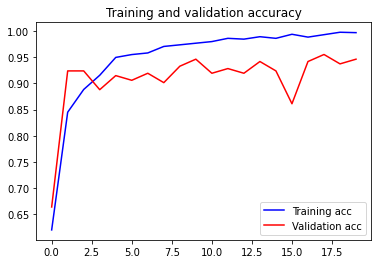

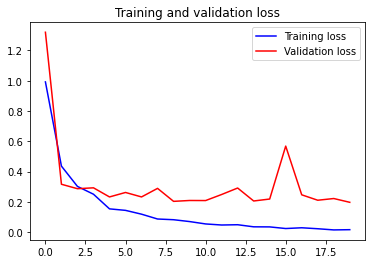

In [0]:
# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Show the errors

Found 223 images belonging to 6 classes.
Instructions for updating:
Please use Model.predict, which supports generators.
12/11 [================================] - 1s 115ms/step
No of errors = 12/223


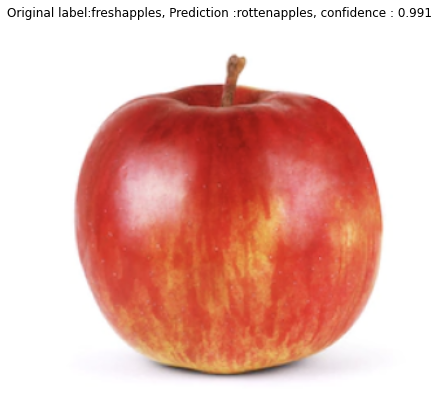

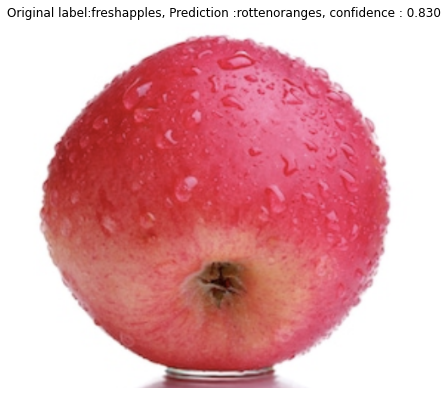

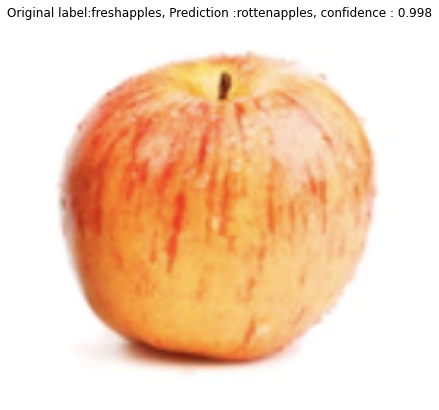

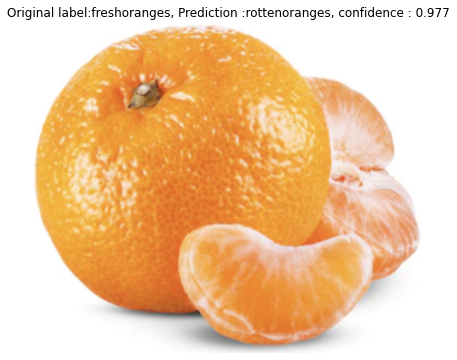

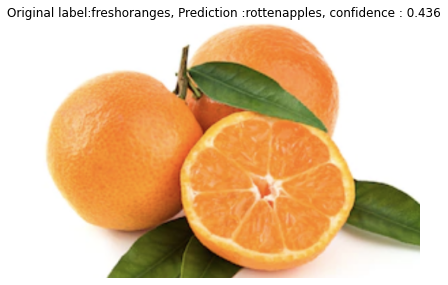

...

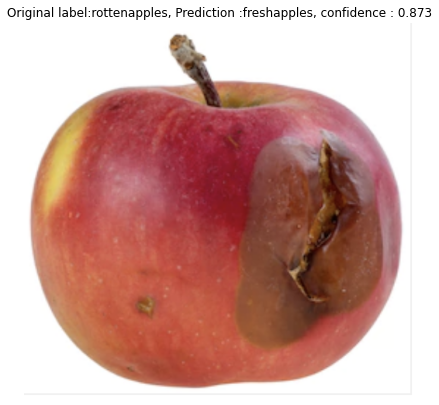

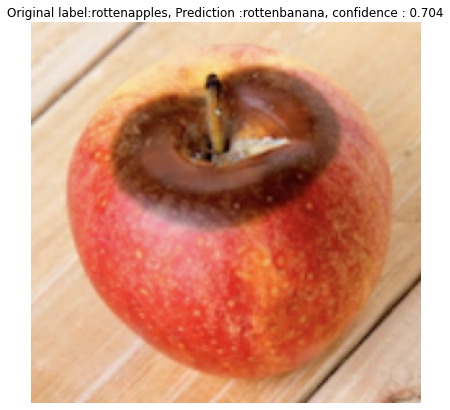

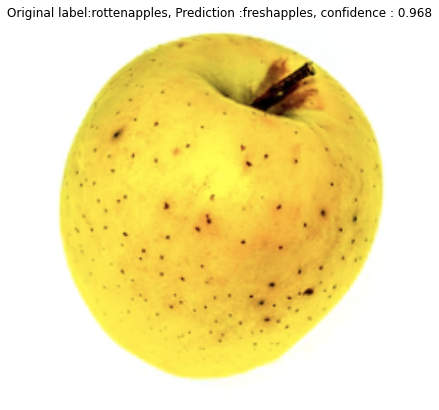

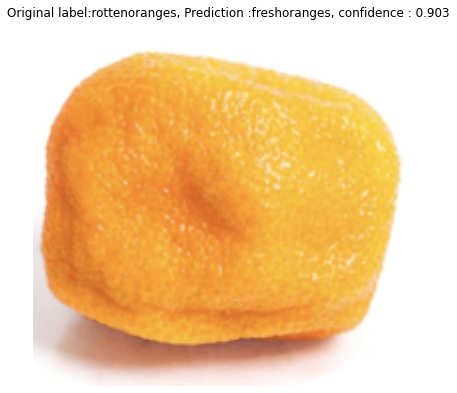

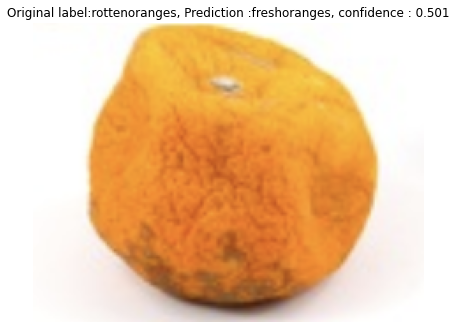

In [0]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

#Experiment 2 : Train Last 4 layers without data augmentation (Fine Tuning)

In this experiment, we will keep the initial layers fixed and only retrain the last 4 layers. Since the initial layers learn more general features, it is a good practice to freeze the initial layers while fine-tuning the latter layers of the network for the new task.

In [0]:
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all layers except the last 4
for layer in vgg_conv.layers[:-4]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f937fa97438> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f937fa972b0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f937fa979b0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f93424e1be0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f93327f99e8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f9332f0c780> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f9332f76940> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f9332f767b8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f9332f74b00> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f9332f5c278> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f9332f52898> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 

In [0]:
# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(len(classnames), activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Model)                (None, 7, 7, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 25088)             0         
_________________________________________________________________
dense_2 (Dense)              (None, 256)               6422784   
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 1542      
Total params: 21,139,014
Trainable params: 13,503,750
Non-trainable params: 7,635,264
_________________________________________________________________


In [0]:
# No Data augmentation 
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 20

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
history = model.fit_generator(
      train_generator,
      steps_per_epoch=train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)


Found 1289 images belonging to 6 classes.
Found 223 images belonging to 6 classes.
Epoch 1/20
26/25 [==============================] - 10s 402ms/step - loss: 1.0950 - acc: 0.6043 - val_loss: 0.4409 - val_acc: 0.8430
Epoch 2/20
26/25 [==============================] - 10s 375ms/step - loss: 0.3740 - acc: 0.8627 - val_loss: 0.5556 - val_acc: 0.8072
Epoch 3/20
26/25 [==============================] - 10s 374ms/step - loss: 0.2118 - acc: 0.9325 - val_loss: 0.3830 - val_acc: 0.8789
Epoch 4/20
26/25 [==============================] - 10s 370ms/step - loss: 0.1630 - acc: 0.9488 - val_loss: 0.2067 - val_acc: 0.9283
Epoch 5/20
26/25 [==============================] - 10s 375ms/step - loss: 0.0591 - acc: 0.9860 - val_loss: 0.2588 - val_acc: 0.9372
Epoch 6/20
26/25 [==============================] - 10s 379ms/step - loss: 0.0736 - acc: 0.9798 - val_loss: 1.7517 - val_acc: 0.7309
Epoch 7/20
26/25 [==============================] - 10s 375ms/step - loss: 0.1171 - acc: 0.9705 - val_loss: 0.2437 - va

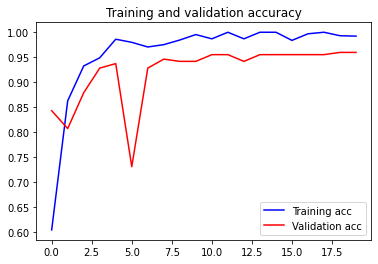

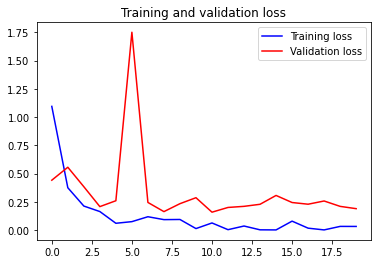

In [0]:
# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Show the errors

Found 223 images belonging to 6 classes.
12/11 [================================] - 1s 115ms/step
No of errors = 9/223


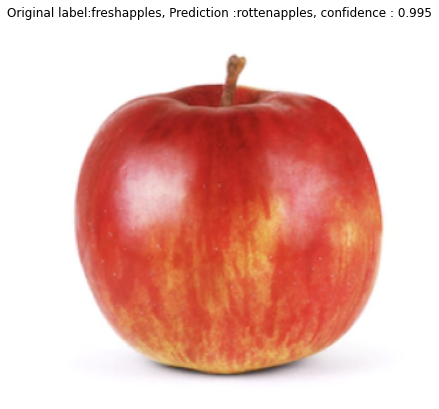

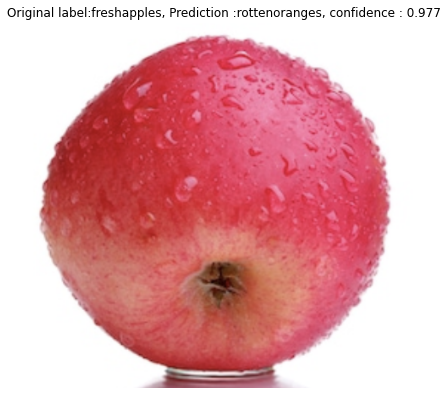

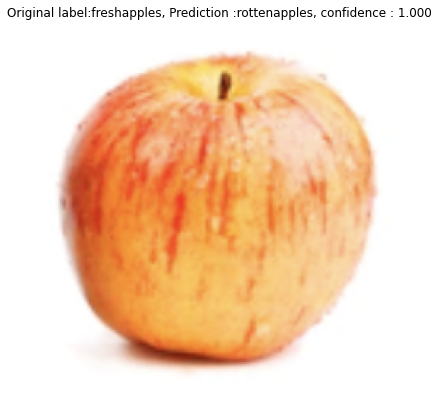

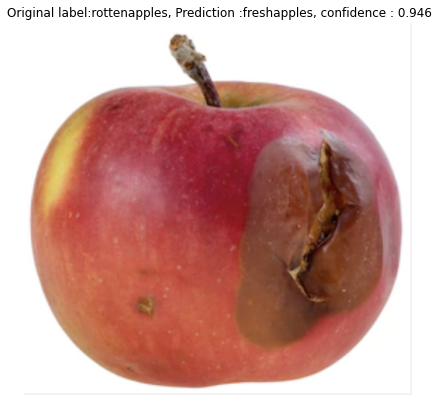

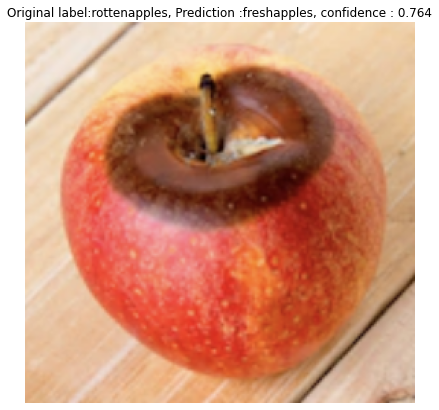

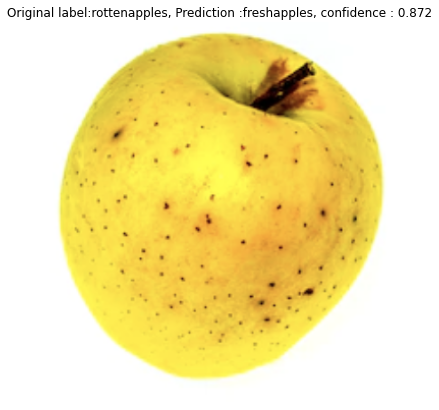

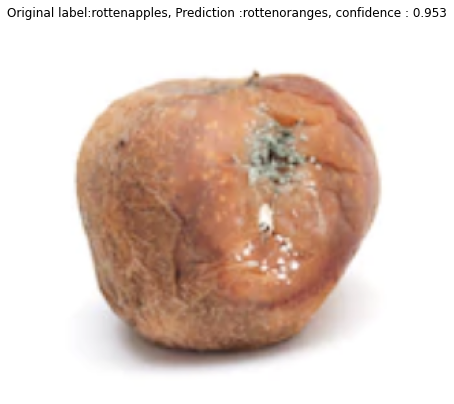

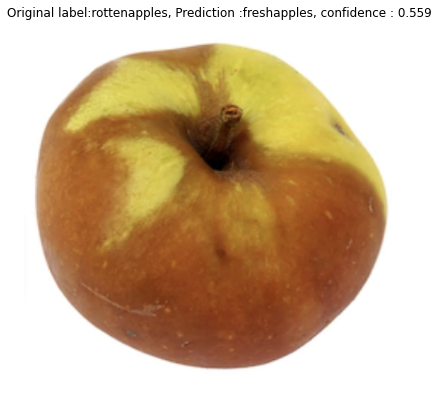

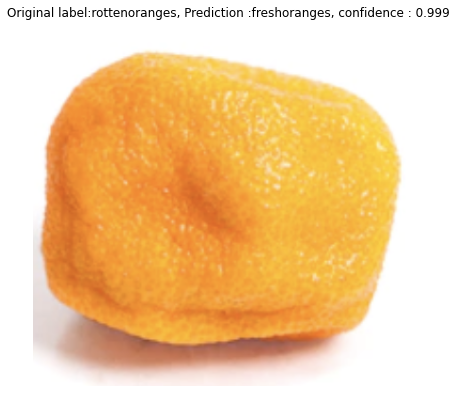

In [0]:
# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [0]:
!ls 

all_freezed.h5		    fruits	 original_data_set
apples-bananas-oranges.zip  kaggle.json  sample_data


In [0]:
! ls -la fruits/train

total 144
drwxr-xr-x 8 root root  4096 Apr  5 17:45 .
drwxr-xr-x 4 root root  4096 Apr  5 17:45 ..
drwxr-xr-x 2 root root 20480 Apr  5 17:45 freshapples
drwxr-xr-x 2 root root 20480 Apr  5 17:45 freshbanana
drwxr-xr-x 2 root root 20480 Apr  5 17:45 freshoranges
drwxr-xr-x 2 root root 28672 Apr  5 17:45 rottenapples
drwxr-xr-x 2 root root 28672 Apr  5 17:45 rottenbanana
drwxr-xr-x 2 root root 20480 Apr  5 17:45 rottenoranges


# Experiment 3 : Train last 8 layers with data augmentation (Fine Tuning)
the previous methods show Overfitting hence data augmentaion.

In [42]:
vgg_conv = VGG16(weights='imagenet', include_top=False, input_shape=(image_size, image_size, 3))

# Freeze all the layers
for layer in vgg_conv.layers[:-8]:
    layer.trainable = False

# Check the trainable status of the individual layers
for layer in vgg_conv.layers:
    print(layer, layer.trainable)

# Create the model
model = models.Sequential()

# Add the vgg convolutional base model
model.add(vgg_conv)

# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(len(classnames), activation='softmax'))

# Show a summary of the model. Check the number of trainable parameters
model.summary()

<tensorflow.python.keras.engine.input_layer.InputLayer object at 0x7f2dc00bd160> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc00bd358> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc00bd5c0> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f2dc00c7828> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc00c76a0> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc00d0c50> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f2dc005db70> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc005d9e8> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc0063d30> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 0x7f2dc00663c8> False
<tensorflow.python.keras.layers.pooling.MaxPooling2D object at 0x7f2dc0071390> False
<tensorflow.python.keras.layers.convolutional.Conv2D object at 

In [43]:
# imageDataGenerator is used for data augmentation.
train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=20,
      width_shift_range=0.2,
      height_shift_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

validation_datagen = ImageDataGenerator(rescale=1./255)

# Change the batchsize according to your system RAM
train_batchsize = 50
val_batchsize = 20

# Data Generator for Training data
train_generator = train_datagen.flow_from_directory(
        train_dir,
        target_size=(image_size, image_size),
        batch_size=train_batchsize,
        class_mode='categorical')

# Data Generator for Validation data
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Compile the model
model.compile(loss='categorical_crossentropy',
              optimizer=optimizers.RMSprop(lr=1e-4),
              metrics=['acc'])

# Train the Model
# NOTE that we have multiplied the steps_per_epoch by 2. This is because we are using data augmentation.
history = model.fit_generator(
      train_generator,
      steps_per_epoch=2*train_generator.samples/train_generator.batch_size ,
      epochs=20,
      validation_data=validation_generator,
      validation_steps=validation_generator.samples/validation_generator.batch_size,
      verbose=1)

Found 5216 images belonging to 2 classes.
Found 624 images belonging to 2 classes.
Instructions for updating:
Please use Model.fit, which supports generators.
Epoch 1/20
209/208 [==============================] - 214s 1s/step - loss: 0.3200 - acc: 0.8610 - val_loss: 0.3006 - val_acc: 0.8910
Epoch 2/20
209/208 [==============================] - 213s 1s/step - loss: 0.1459 - acc: 0.9493 - val_loss: 0.4007 - val_acc: 0.8638
Epoch 3/20
209/208 [==============================] - 213s 1s/step - loss: 0.1008 - acc: 0.9636 - val_loss: 0.4220 - val_acc: 0.8141
Epoch 4/20
209/208 [==============================] - 208s 997ms/step - loss: 0.0824 - acc: 0.9699 - val_loss: 0.8932 - val_acc: 0.7740
Epoch 5/20
209/208 [==============================] - 208s 996ms/step - loss: 0.0811 - acc: 0.9729 - val_loss: 1.1332 - val_acc: 0.7724
Epoch 6/20
209/208 [==============================] - 209s 1s/step - loss: 0.0834 - acc: 0.9767 - val_loss: 0.3556 - val_acc: 0.8734
Epoch 7/20
209/208 [=================

Note above training takes more time since 8 layers are being un-freezed!

In [0]:
# Save the Model
model.save('Exp3.h5')

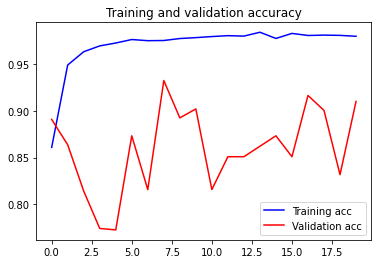

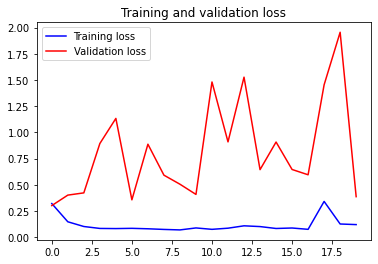

In [45]:
# Plot the accuracy and loss curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

Found 624 images belonging to 2 classes.
Instructions for updating:
Please use Model.predict, which supports generators.
32/31 [==============================] - 5s 169ms/step
No of errors = 56/624


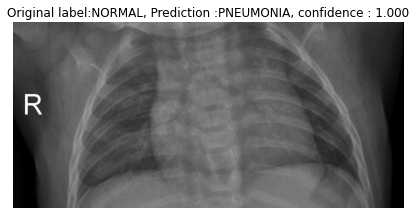

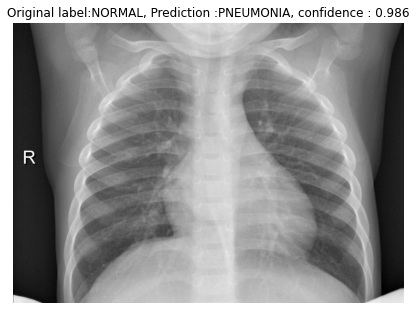

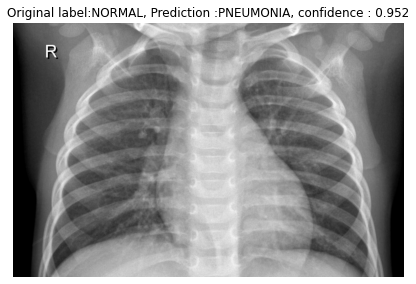

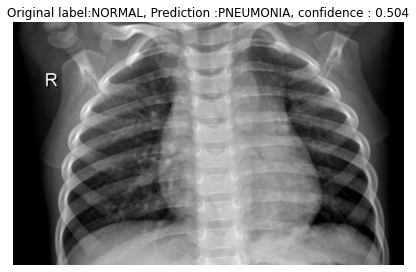

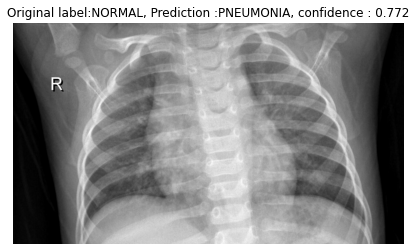

...

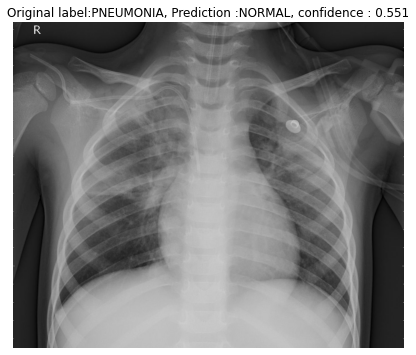

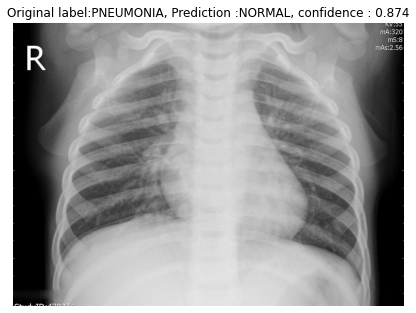

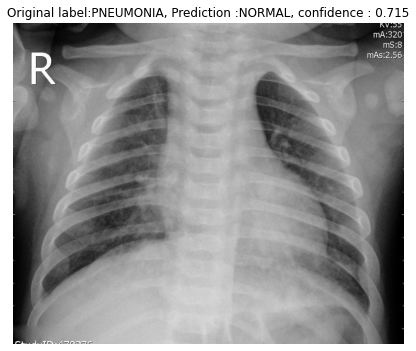

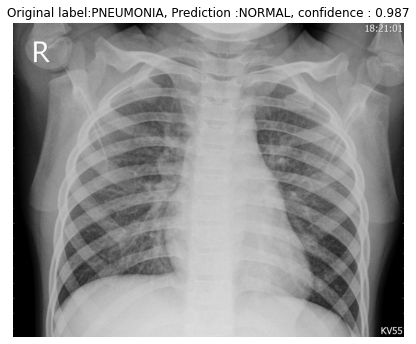

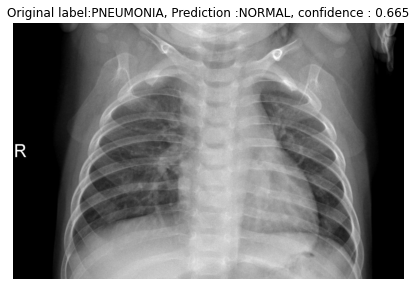

In [46]:
# Show the errors

# Create a generator for prediction
validation_generator = validation_datagen.flow_from_directory(
        validation_dir,
        target_size=(image_size, image_size),
        batch_size=val_batchsize,
        class_mode='categorical',
        shuffle=False)

# Get the filenames from the generator
fnames = validation_generator.filenames

# Get the ground truth from generator
ground_truth = validation_generator.classes

# Get the label to class mapping from the generator
label2index = validation_generator.class_indices

# Getting the mapping from class index to class label
idx2label = dict((v,k) for k,v in label2index.items())

# Get the predictions from the model using the generator
predictions = model.predict_generator(validation_generator, steps=validation_generator.samples/validation_generator.batch_size,verbose=1)
predicted_classes = np.argmax(predictions,axis=1)

errors = np.where(predicted_classes != ground_truth)[0]
print("No of errors = {}/{}".format(len(errors),validation_generator.samples))

# Show the errors
for i in range(len(errors)):
    pred_class = np.argmax(predictions[errors[i]])
    pred_label = idx2label[pred_class]
    
    title = 'Original label:{}, Prediction :{}, confidence : {:.3f}'.format(
        fnames[errors[i]].split('/')[0],
        pred_label,
        predictions[errors[i]][pred_class])
    
    original = load_img('{}/{}'.format(validation_dir,fnames[errors[i]]))
    plt.figure(figsize=[7,7])
    plt.axis('off')
    plt.title(title)
    plt.imshow(original)
    plt.show()

In [0]:
!pwd

/content


In [47]:
!ls

chest_xray  chest-xray-pneumonia.zip  Exp3.h5  kaggle.json  sample_data
